In [4]:
import jijmodeling as jm
import jijmodeling_transpiler as jmt
from openjij import SASampler
import numpy as np
import matplotlib.pyplot as plt

In [5]:
sampler = SASampler()

In [13]:
N = 20
x = jm.BinaryVar('x', shape=(N,))
i = jm.Element('i', belong_to=(0, N))
W = jm.Placeholder('W', ndim=1)

In [14]:
problem = jm.Problem('Number partition', sense=jm.ProblemSense.MINIMIZE)

In [15]:
problem += (jm.sum(i, W[i] * x[i]) - jm.sum(i, W[i] * (1 - x[i])))**2

In [16]:
problem

In [18]:
Wvec = np.random.rand(N)
isinstance_data = {'W': Wvec}

In [21]:
compiled_model = jmt.core.compile_model(problem, isinstance_data, {})
pubo_builder  = jmt.core.pubo.transpile_to_pubo(compiled_model)
qubo, const = pubo_builder.get_qubo_dict()

In [22]:
num_reads = 10
sampleset = sampler.sample_qubo(qubo, num_reads=num_reads)

In [23]:
sampleset.record

rec.array([([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], -0.99988751, 1),
           ([0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1], -0.99998484, 1),
           ([0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], -0.99999887, 1),
           ([1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], -0.99999781, 1),
           ([0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0], -0.99998249, 1),
           ([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0], -0.99990361, 1),
           ([1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], -0.99999015, 1),
           ([0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0], -0.99998548, 1),
           ([1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0], -0.99985284, 1),
           ([1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0], -0.99995673, 1)],
          dtype=[('sample', 'i1', (20,)), ('energy', '<f8'), ('num_occurrences', '<i8')])

In [26]:
result = jmt.core.pubo.decode_from_openjij(sampleset, pubo_builder, compiled_model)
result

SampleSet(record=Record(solution={'x': [(([1, 2, 8, 9, 10, 11, 12, 14, 18, 19],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([0, 1, 3, 5, 8, 9, 10, 11, 15, 17, 19],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([0, 1, 4, 5, 12, 13, 15, 16, 17, 19],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([1, 4, 6, 9, 10, 11, 13, 14, 16, 17],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([2, 7, 9, 11, 12, 17, 18, 19],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([1, 2, 4, 7, 9, 10, 14, 15, 17],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([0, 1, 2, 4, 6, 9, 10, 12, 13, 17, 18],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([6, 7, 8, 10, 11, 12, 14, 15, 18],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([2, 4, 6, 13, 14, 15, 16, 17, 19],), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20,)), (([0, 3, 4, 5, 6, 9, 10, 13, 14, 15, 17],), [1.0, 1.0, 1.0, 1.0, 1.0, 1

In [27]:
result.record.solution['x'][0][0][0]

[1, 2, 8, 9, 10, 11, 12, 14, 18, 19]

In [28]:
N = 20
M = 5

In [29]:
x = jm.BinaryVar('x', shape=(N, M))
i_1 = jm.Element('i_1', belong_to=(0, N))
i_2 = jm.Element('i_2', belong_to=(0, N))
j = jm.Element('j', belong_to=(0, M))
C = jm.Placeholder('C', ndim=2)

In [31]:
problem = jm.Problem('Grouping', sense=jm.ProblemSense.MAXIMIZE)
problem += jm.sum([i_1, i_2, j], C[i_1, i_2] * x[i_1, j] * x[i_2, j])
problem += jm.Constraint("one group", jm.sum(j, x[i_1, j]) == 1, forall=i_1)

In [33]:
problem

In [44]:
Cmat = np.random.randn(N, N).reshape(N, N)
Cmat = (Cmat + Cmat.T)
isinstance_data = {'C': Cmat}

In [45]:
compiled_model = jmt.core.compile_model(problem, isinstance_data, {})
pubo_builder = jmt.core.pubo.transpile_to_pubo(compiled_model)
qubo, const = pubo_builder.get_qubo_dict(multipliers={"one group":2.0})

In [46]:
sampler = SASampler()
num_reads = 100
sampleset = sampler.sample_qubo(qubo, num_reads=num_reads)

In [50]:
result = jmt.core.pubo.decode_from_openjij(sampleset, pubo_builder, compiled_model)
result
feasible_samples = result.feasible()
feasible_samples

SampleSet(record=Record(solution={'x': [(([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [1, 0, 3, 3, 3, 3, 0, 0, 1, 1, 3, 0, 4, 1, 3, 0, 0, 3, 3, 3]), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20, 5)), (([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [4, 0, 2, 1, 1, 1, 0, 0, 4, 4, 1, 3, 2, 4, 1, 0, 0, 1, 1, 1]), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20, 5)), (([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [3, 1, 1, 4, 4, 4, 0, 0, 3, 3, 4, 1, 0, 3, 1, 0, 0, 4, 4, 4]), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], (20, 5)), (([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [0, 1, 1, 3, 3, 3, 2, 1, 0, 4, 3, 2, 0, 0, 3, 2, 1, 3, 3, 3]), [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

In [53]:
feasible_samples.record.solution['x'][0][0]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [1, 0, 3, 3, 3, 3, 0, 0, 1, 1, 3, 0, 4, 1, 3, 0, 0, 3, 3, 3])

In [63]:
import glob
files = glob.glob(r'/face/*')

In [65]:
import cv2
im = cv2.imread(files[4])
mat = im[:,:,0]

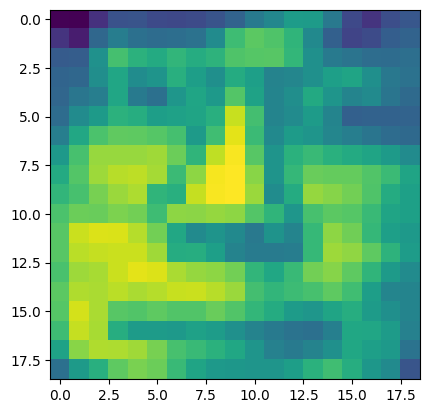

In [66]:
plt.imshow(mat)
plt.show()

In [67]:
ylist = []
for file in files:
    im = cv2.imread(file)
    mat = im[:,:,0].flatten()
    ylist.append(mat)

In [68]:
M = len(ylist)
N = len(mat)

In [69]:
M, N

(2429, 361)

In [70]:
K = 10
x = jm.BinaryVar('x', shape=(K,))
k1 = jm.Element('k1', belong_to=(0, K))
k2 = jm.Element('k2', belong_to=(0, K))
a = jm.Placeholder('a', ndim=1)
Q = jm.Placeholder('Q', ndim=2)
lam = jm.Placeholder('lam', ndim=0)

In [71]:
problem = jm.Problem('NMF_faces', sense=jm.ProblemSense.MINIMIZE)
sum1 = -2 * jm.sum(k1, a[k1] * x[k1])
sum2 = jm.sum([k1, k2], Q[k1, k2] * x[k1] * x[k2])
sum3 = lam * jm.sum(k1, x[k1])
problem += sum1 + sum2 + sum3

In [72]:
W = np.random.rand(N*K).reshape(N,K)
d = 0
yvec = ylist[d]
Qmat = np.dot(W.T,W)
avec = np.dot(yvec,W)
lam = 1.0
instance_data = {'Q': Qmat , "a": avec, "lam": lam}

In [73]:
compiled_model = jmt.core.compile_model(problem, instance_data, {})
pubo_builder = jmt.core.pubo.transpile_to_pubo(compiled_model=compiled_model)
qubo, const = pubo_builder.get_qubo_dict(multipliers={})

In [74]:
num_reads = 10
sampler = SASampler()
sampleset = sampler.sample_qubo(qubo, num_reads=num_reads)

In [75]:
def calc_grad(sampleset,num_reads=num_reads):
  qubo_model = np.zeros(K**2).reshape(K,K)
  for k in range(num_reads):
    qubo_model = qubo_model + np.outer(sampleset.record[k][0],sampleset.record[k][0])/num_reads
  return qubo_model

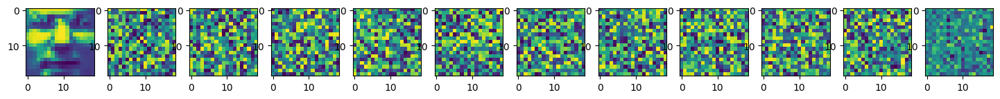

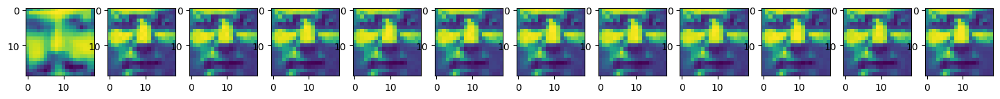

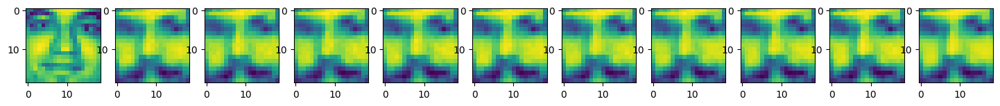

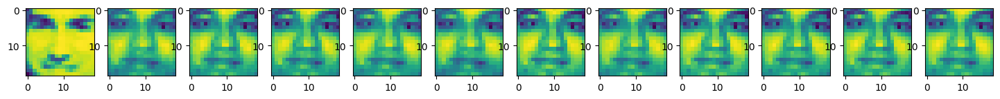

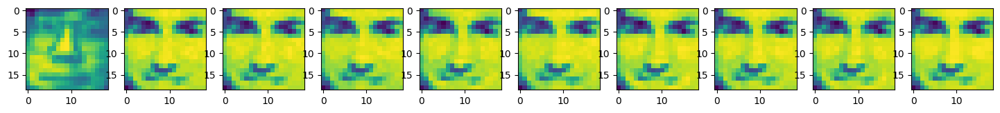

...

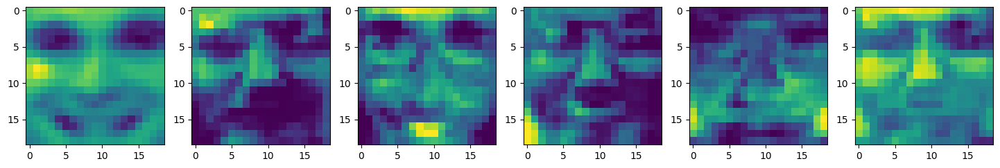

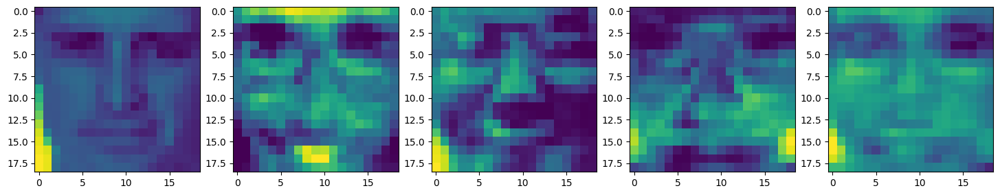

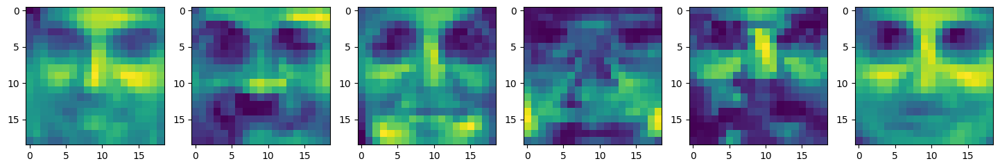

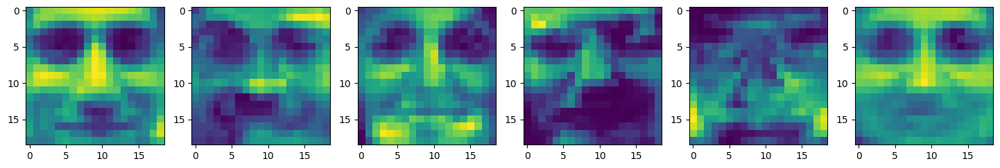

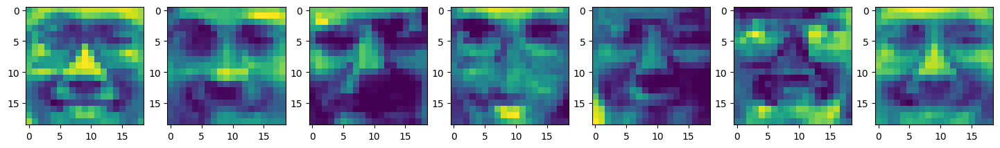

In [76]:
eta = 0.1
Tall = 20

for t in range(Tall):
  for d in range(M//100):
    yvec = ylist[d]
    Qmat = np.dot(W.T,W)
    avec = np.dot(yvec,W)
    lam = 1.0
    instance_data = {'Q': Qmat , "a": avec, "lam": lam}
    compiled_model = jmt.core.compile_model(problem, instance_data, {})
    pubo_builder = jmt.core.pubo.transpile_to_pubo(compiled_model=compiled_model)
    qubo, const = pubo_builder.get_qubo_dict(multipliers={})
    sampleset = sampler.sample_qubo(qubo, num_reads=num_reads)
    result = jmt.core.pubo.decode_from_openjij(sampleset, pubo_builder, compiled_model)
    face_list = result.record.solution["x"][0][0][0]
    qubo_model = calc_grad(sampleset)
    plt.figure(figsize=(18, 4))
    plt.subplot(1,len(face_list)+2,1)
    plt.imshow(yvec.reshape(19,19))
    face_sol = np.zeros(N).reshape(19,19)
    for k in range(len(face_list)):
      plt.subplot(1,len(face_list)+2,k+2)
      plt.imshow(W[:,face_list[k]].reshape(19,19))
      face_sol = face_sol + W[:,face_list[k]].reshape(19,19)
    plt.subplot(1,len(face_list)+2,len(face_list)+2)
    plt.imshow(face_sol.reshape(19,19))
    plt.show()
    W = W + eta*(np.outer(yvec.reshape(N,1),np.diag(qubo_model).reshape(1,K)) - np.dot(W,qubo_model))
    W = W.clip(min=0)